## Rikai DSL for Image Visualization <a href="https://colab.research.google.com/github/eto-ai/rikai/blob/main/notebooks/MojitoDSL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

There are three python types available for the `|` operator:

+ Box2d
+ Text
+ Mask

In [ ]:
!pip install ipyplot
!pip install rikai
!pip install ipython==7.31.1

In [1]:
from rikai.types import Image, Box2d, Mask
from rikai.viz import Text

uri = 'https://i.scdn.co/image/ab67616d0000b273466def3ce70d94dcacb13c8d'
image = Image(uri)
image

Image(uri=https://i.scdn.co/image/ab67616d0000b273466def3ce70d94dcacb13c8d)

In [2]:
box2d_demo = image | Box2d(118, 18, 520, 136)
box2d_demo.to_image()

Image(<embedded>)

In [3]:
box2d_demo2 = image | Box2d(118, 18, 520, 136) @ {"color": "#FFF6B0"}
box2d_demo2

Draw(style({'color': '#FFF6B0'}))

In [4]:
text_demo = image | Box2d(118, 18, 520, 136) | Text("Mojito", (118, 8))
text_demo

Draw(Box2d(xmin=118.0, ymin=18.0, xmax=520.0, ymax=136.0))

In [5]:
text_demo2 = image | Box2d(118, 18, 520, 136) | Text("Mojito", (118, 8)) @ {"color": "#000000"}
text_demo2

Draw(Box2d(xmin=118.0, ymin=18.0, xmax=520.0, ymax=136.0))

In [6]:
mask = Mask.from_polygon([[118, 18, 118, 136, 520, 136, 520, 18]], image.to_pil().width, image.to_pil().height)
mask_demo = image | mask
mask_demo

Draw(Mask(type=Type.POLYGON, data=...))

In [7]:
mask_demo2 = image | mask @ {"color": "#FFF6B0"}
mask_demo2

Draw(style({'color': '#FFF6B0'}))

/Users/da/.pyenv/versions/rikai/lib/python3.8/site-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))



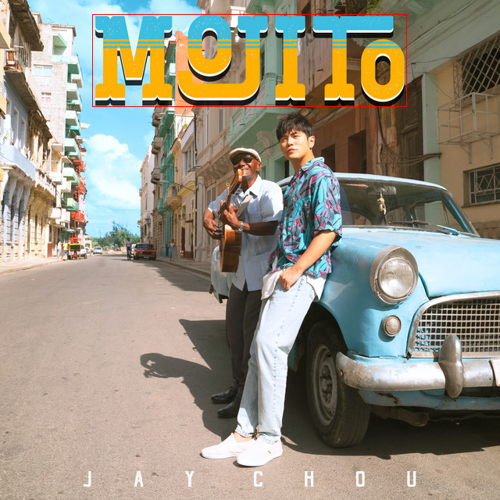
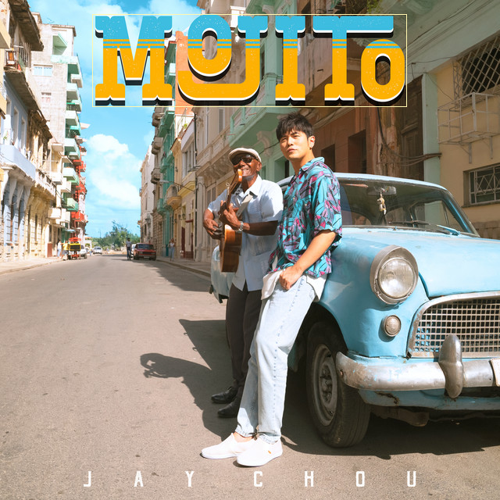
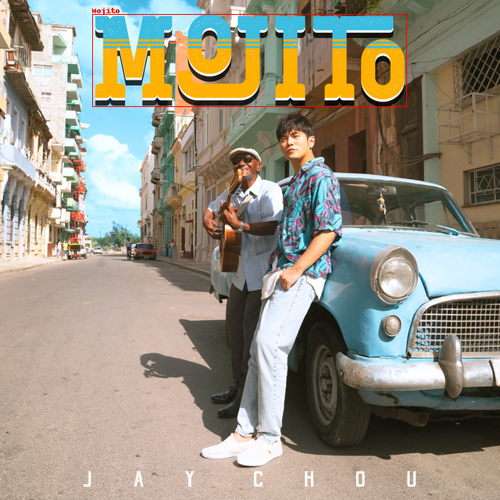
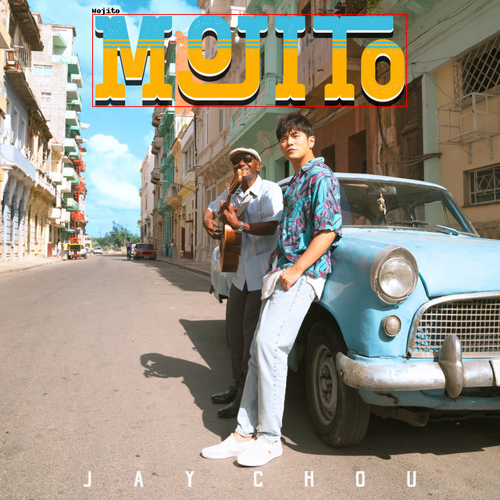
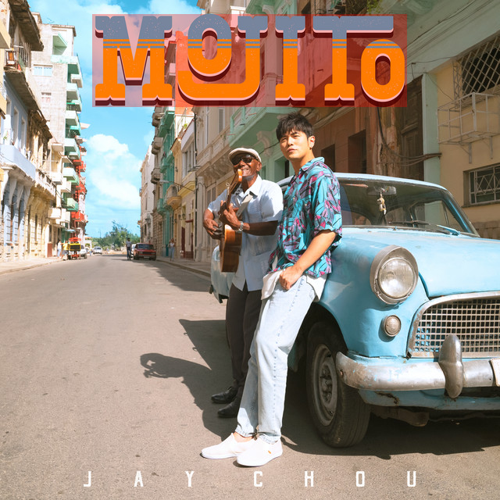
...
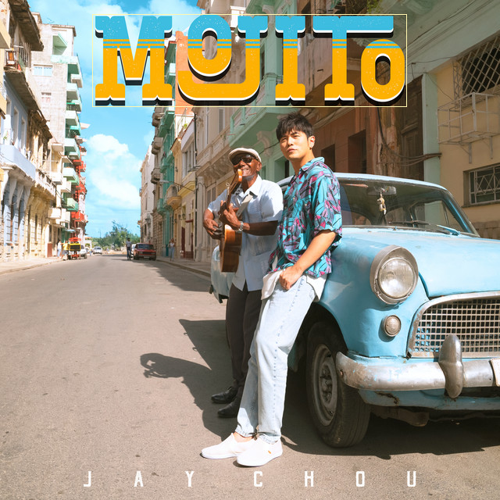
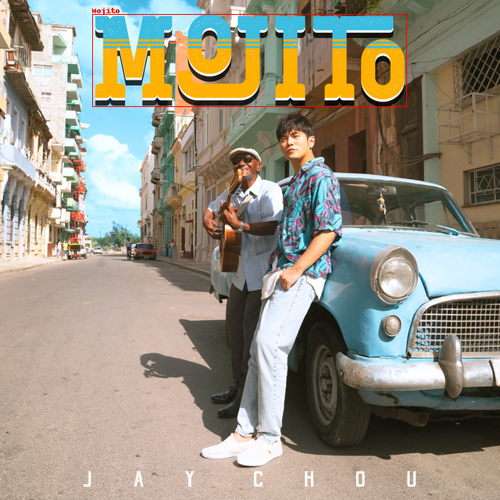
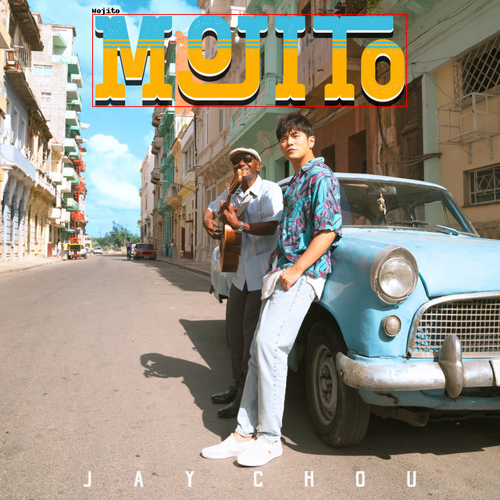
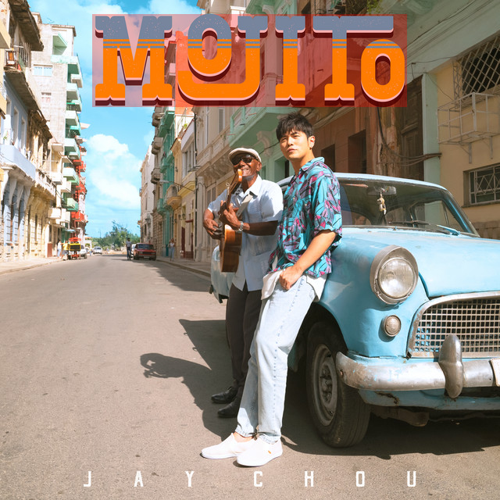
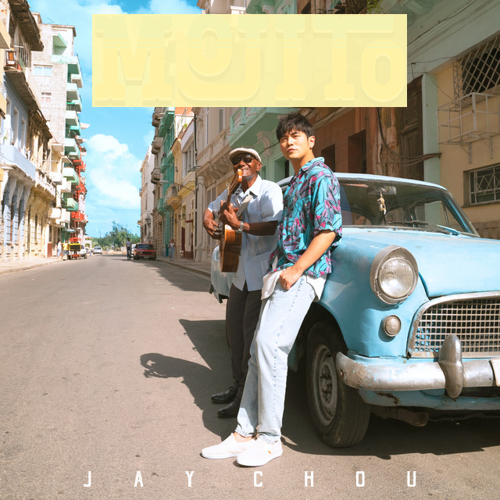

In [8]:
import ipyplot
images = [draw.to_image().to_pil() for draw in [box2d_demo, box2d_demo2, text_demo, text_demo2, mask_demo, mask_demo2]]
ipyplot.plot_images(images, img_width=500)